<a href="https://colab.research.google.com/github/memetsumer/Airsim-UAV-SAR-Yolov5/blob/main/YOLOv5n_AirSim_SAR_UAV_17_05_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13442, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 13442 (delta 16), reused 8 (delta 4), pack-reused 13414
Receiving objects: 100% (13442/13442), 12.11 MiB | 30.63 MiB/s, done.
Resolving deltas: 100% (9374/9374), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.9 MB/s 
     |████████████████████████████████| 145 kB 5.0 MB/s 
     |████████████████████████████████| 178 kB 53.9 MB/s 
     |████████████████████████████████| 1.1 MB 48.2 MB/s 
     |████████████████████████████████| 67 kB 7.3 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 138 kB 50.4 MB/s 
     |████████████████████████████████| 63 kB 320 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-co

# Step 2: Assemble Our Dataset



In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
rf = Roboflow(api_key="FVzZqK17eHglQIOBJOaE")
project = rf.workspace("sumer682000-gmail-com").project("makale")
dataset = project.version(5).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/makale-5 in yolov5pytorch:: 100%|██████████| 972/972 [00:00<00:00, 1240.13it/s]


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [5]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5n.pt --cache

train: weights=yolov5n.pt, cfg=, data=/content/datasets/makale-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-196-g614ef11 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/makale-5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-196-g614ef11 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 1760518 parameters, 0 gradients, 4.2 GFLOPs
image 1/20 /content/datasets/makale-5/test/images/image_1019_png.rf.618757c0cf5026f3657bedbbe9337931.jpg: 416x416 3 ps, Done. (0.009s)
image 2/20 /content/datasets/makale-5/test/images/image_1086_png.rf.808e5aa4f7edbef66e3049df36a9164d.jpg: 416x416 5 ps, Done. (0.008s)
image 3/20 /content/datasets/makale-5/test/images/image_110_png.rf.0e164d

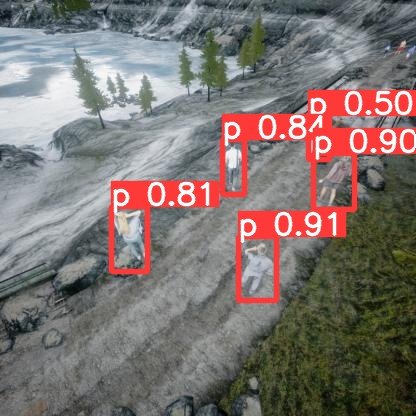

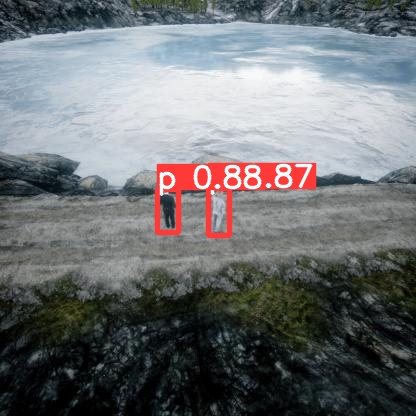

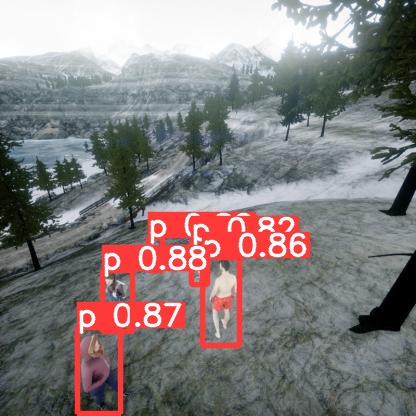

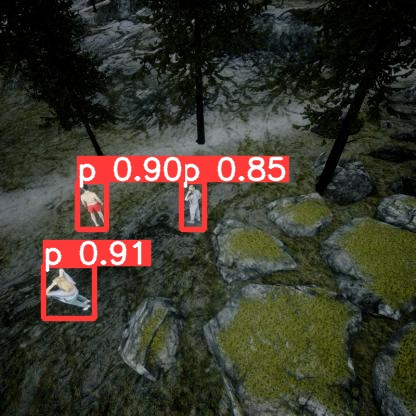

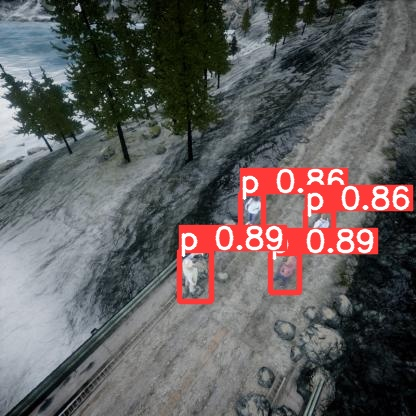

...

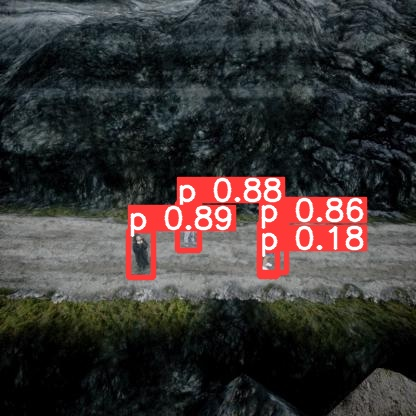

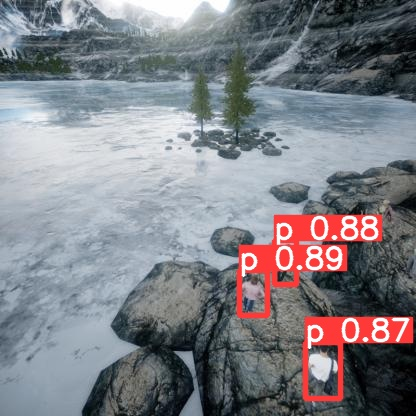

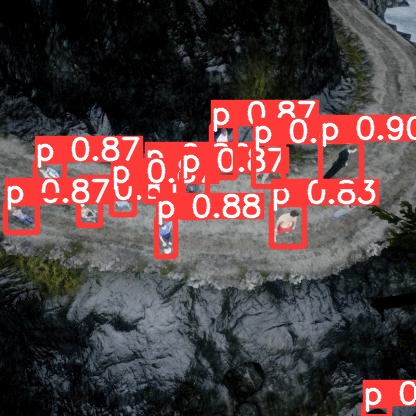

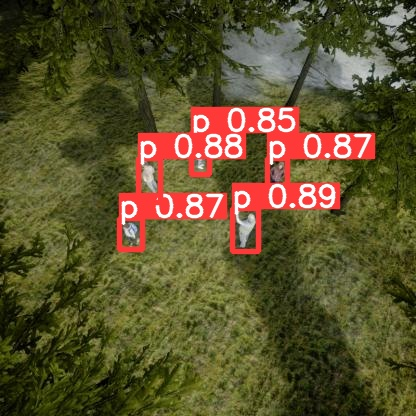

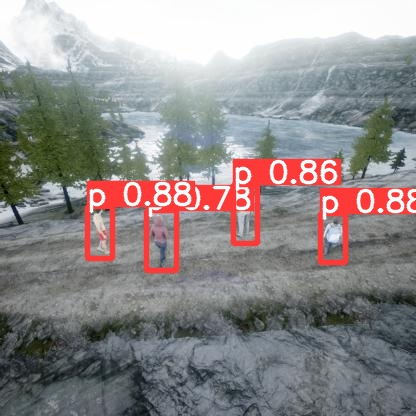

In [8]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [9]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [10]:
!pwd

/content/yolov5


In [13]:
!zip -r  ./runs_zipped ./runs

updating: runs/ (stored 0%)
updating: runs/detect/ (stored 0%)
updating: runs/detect/exp/ (stored 0%)
updating: runs/detect/exp/image_3656_png.rf.71f9c784d7d6d1ab251cda96458b8e02.jpg (deflated 3%)
updating: runs/detect/exp/image_457_png.rf.fff5a1ae5473e1a39633c0fe5bc544dd.jpg (deflated 4%)
updating: runs/detect/exp/image_1086_png.rf.808e5aa4f7edbef66e3049df36a9164d.jpg (deflated 4%)
updating: runs/detect/exp/image_1110_png.rf.4ad110c0d8fd8210e312fa27bd13aac7.jpg (deflated 3%)
updating: runs/detect/exp/image_497_png.rf.f280754379a1568d88d730e31a0c24e7.jpg (deflated 4%)
updating: runs/detect/exp/image_1130_png.rf.7b6e4efdbbe48484ae45d0d40d9a895e.jpg (deflated 4%)
updating: runs/detect/exp/image_1019_png.rf.618757c0cf5026f3657bedbbe9337931.jpg (deflated 4%)
updating: runs/detect/exp/image_121_png.rf.644d8baa841aadabd1da04058cde18f5.jpg (deflated 4%)
updating: runs/detect/exp/image_177_png.rf.394d9c301e79a7d0fd594d557b7aaef8.jpg (deflated 4%)
updating: runs/detect/exp/image_3373_png.rf.ece